### Repeating the process of producing the LDA visualizations for each of the episodes for the final season ###

In [1]:
from glob import glob
import re
import string
import funcy as fp
from gensim import models
from gensim.corpora import Dictionary, MmCorpus
import nltk
import pandas as pd
from wordcloud import WordCloud, STOPWORDS
import numpy as np
import matplotlib.pyplot as plt

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
import numpy as np
import pickle
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer 
from sklearn.decomposition import TruncatedSVD

In [5]:
night = pickle.load( open( "./Data/long_night_3.pkl", "rb" ) )

In [6]:
night = night.dropna()

In [10]:
night.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 72948 entries, 84198 to 158167
Data columns (total 2 columns):
Publish Date    72948 non-null datetime64[ns]
clean           72948 non-null object
dtypes: datetime64[ns](1), object(1)
memory usage: 4.2+ MB


In [11]:
text = night['clean']

In [14]:
import spacy
from spacy.lang.en import English
parser = English()

def tokenize(text):
    lda_tokens = []
    tokens = parser(text)
    for token in tokens:
        if token.orth_.isspace():
            continue
        elif token.like_url:
            lda_tokens.append('URL')
        elif token.orth_.startswith('@'):
            lda_tokens.append('SCREEN_NAME')
        else:
            lda_tokens.append(token.lower_)
    return lda_tokens

In [15]:
import nltk
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/nborders/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [16]:
from nltk.corpus import wordnet as wn
def get_lemma(word):
    lemma = wn.morphy(word)
    if lemma is None:
        return word
    else:
        return lemma
    
from nltk.stem.wordnet import WordNetLemmatizer
def get_lemma2(word):
    return WordNetLemmatizer().lemmatize(word)

In [17]:
import warnings
warnings.filterwarnings('ignore')
warnings.filterwarnings(action='once')

In [18]:
nltk.download('stopwords')
en_stop = set(nltk.corpus.stopwords.words('english'))

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/nborders/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [19]:
stop_words = ['would', 'could', 'might', 'season', 'think', 'one', 'watch', 'episode', 'something', 'theory', 'maybe',
             'scene', 'anyone', 'really', 'still', 'anyone', 'already', 'anything', 'never', 'everyone', 'even']

In [20]:
def prepare_text_for_lda(text):
    tokens = tokenize(text)
    tokens = [token for token in tokens if len(token) > 4]
    tokens = [token for token in tokens if token not in en_stop]
    tokens = [token for token in tokens if token not in stop_words]
    tokens = [get_lemma(token) for token in tokens]
    return tokens

In [25]:
import random
text_data = []
for line in text:
    tokens = prepare_text_for_lda(line)
    if random.random() > .99:
        text_data.append(tokens)

In [26]:
text_data = [x for x in text_data if x != []]

In [27]:
from gensim import corpora
dictionary = corpora.Dictionary(text_data)

In [28]:
corpus = [dictionary.doc2bow(text) for text in text_data]

In [29]:
import pickle
#pickle.dump(corpus, open('corpus_before.pkl', 'wb'))
#dictionary.save('dictionary_before.gensim')

In [30]:
import gensim
NUM_TOPICS = 2
ldamodel = gensim.models.ldamodel.LdaModel(corpus, num_topics = NUM_TOPICS, id2word=dictionary, passes=15)
#ldamodel.save('model4_before.gensim')

/anaconda3/lib/python3.7/site-packages/gensim/models/ldamodel.py:826: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)


In [31]:
topics = ldamodel.print_topics(num_words=10)
for topic in topics:
    print(topic)

(0, '0.013*"night" + 0.011*"white" + 0.009*"dothraki" + 0.009*"walker" + 0.008*"wight" + 0.007*"dragon" + 0.007*"fight" + 0.006*"battle" + 0.006*"sword" + 0.006*"melisandre"')
(1, '0.026*"night" + 0.012*"battle" + 0.011*"people" + 0.008*"cersei" + 0.007*"throne" + 0.007*"fight" + 0.006*"going" + 0.006*"white" + 0.006*"character" + 0.006*"winterfell"')


In [ ]:
#dictionary = gensim.corpora.Dictionary.load('dictionary.gensim')
#corpus = pickle.load(open('corpus.pkl', 'rb'))
#lda = gensim.models.ldamodel.LdaModel.load('model5.gensim')

In [32]:
import pyLDAvis.gensim
lda_display = pyLDAvis.gensim.prepare(ldamodel, corpus, dictionary, sort_topics=False)
pyLDAvis.display(lda_display)

/anaconda3/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)
/anaconda3/lib/python3.7/site-packages/numpy/matrixlib/defmatrix.py:71: PendingDeprecationWarning: the matrix subclass is not the recommended way to represent matrices or deal with linear algebra (see https://docs.scipy.org/doc/numpy/user/numpy-for-matlab-users.html). Please adjust your code to use regular ndarray.
  return matrix(data, dtype=dtype, copy=False)
/anaconda3/lib/python3.7/site-packages/pyLDAvis/_prepare.py:257: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  return pd.concat([default_term_info] + list(topic_dfs))


In [33]:
#pyLDAvis.save_html(lda_display, 'lda_night.html')

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: ResourceWarning: unclosed file <_io.TextIOWrapper name='lda_night.html' mode='w' encoding='UTF-8'>
  """Entry point for launching an IPython kernel.


In [34]:
corpus_cloud = ' '.join(night['clean'])

In [35]:
STOPWORDS.update(['would', 'could', 'might', 'season', 'think', 'one', 'watch', 'episode', 'something', 'theory', 'maybe',
             'scene', 'anyone', 'really', 'still', 'anyone', 'already', 'anything', 'never', 'everyone', 'even'])

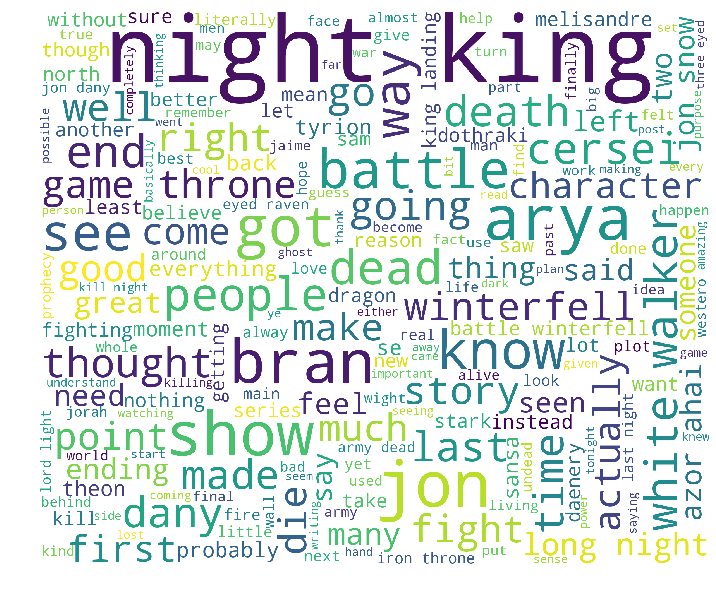

In [36]:
wordcloud = WordCloud(stopwords=STOPWORDS, background_color='white',width=2400,height=2000).generate(corpus_cloud)
plt.figure(figsize=(12,15))
plt.imshow(wordcloud)
plt.axis('off')
#plt.savefig('night.svg')
#plt.savefig('night.png')
plt.show()

In [37]:
from yellowbrick.text import TSNEVisualizer
from sklearn.feature_extraction.text import TfidfVectorizer
from yellowbrick.features import ParallelCoordinates

In [40]:
tfidf  = TfidfVectorizer()

docs   = tfidf.fit_transform(night['clean'])

/anaconda3/lib/python3.7/site-packages/numpy/matrixlib/defmatrix.py:71: PendingDeprecationWarning: the matrix subclass is not the recommended way to represent matrices or deal with linear algebra (see https://docs.scipy.org/doc/numpy/user/numpy-for-matlab-users.html). Please adjust your code to use regular ndarray.
  return matrix(data, dtype=dtype, copy=False)


In [42]:
from sklearn.cluster import KMeans
import seaborn as sns

/anaconda3/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)
/anaconda3/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 216, got 192
  return f(*args, **kwds)
/anaconda3/lib/python3.7/importlib/_bootstrap.py:219: ImportWarning: can't resolve package from __spec__ or __package__, falling back on __name__ and __path__
  return f(*args, **kwds)
/anaconda3/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)


/anaconda3/lib/python3.7/site-packages/numpy/matrixlib/defmatrix.py:71: PendingDeprecationWarning: the matrix subclass is not the recommended way to represent matrices or deal with linear algebra (see https://docs.scipy.org/doc/numpy/user/numpy-for-matlab-users.html). Please adjust your code to use regular ndarray.
  return matrix(data, dtype=dtype, copy=False)
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


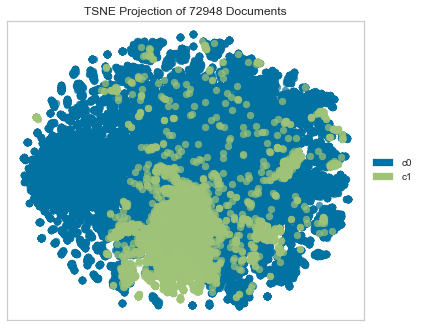

In [43]:
clusters = KMeans(n_clusters=2)
clusters.fit(docs)

tsne = TSNEVisualizer()
tsne.fit(docs, ["c{}".format(c) for c in clusters.labels_])
tsne.poof()


### Experimenting with an interactive TSNE plot ###

In [44]:
from __future__ import print_function
import time
import numpy as np
import pandas as pd
from sklearn.datasets import fetch_mldata
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
%matplotlib inline
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns

In [45]:
df = pd.DataFrame()

In [43]:
svd = TruncatedSVD(2)
pca_result = svd.fit_transform(docs)

df['pca-one'] = pca_result[:,0]
df['pca-two'] = pca_result[:,1] 
print('Explained variation per principal component: {}'.format(svd.explained_variance_ratio_))

Explained variation per principal component: [0.00912764 0.01079414]


In [47]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(pca_result)
print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 16940 samples in 0.005s...
[t-SNE] Computed neighbors for 16940 samples in 0.320s...
[t-SNE] Computed conditional probabilities for sample 1000 / 16940
[t-SNE] Computed conditional probabilities for sample 2000 / 16940
[t-SNE] Computed conditional probabilities for sample 3000 / 16940
[t-SNE] Computed conditional probabilities for sample 4000 / 16940
[t-SNE] Computed conditional probabilities for sample 5000 / 16940
[t-SNE] Computed conditional probabilities for sample 6000 / 16940
[t-SNE] Computed conditional probabilities for sample 7000 / 16940
[t-SNE] Computed conditional probabilities for sample 8000 / 16940
[t-SNE] Computed conditional probabilities for sample 9000 / 16940
[t-SNE] Computed conditional probabilities for sample 10000 / 16940
[t-SNE] Computed conditional probabilities for sample 11000 / 16940
[t-SNE] Computed conditional probabilities for sample 12000 / 16940
[t-SNE] Computed conditional probabilities for sa

/anaconda3/lib/python3.7/site-packages/numpy/matrixlib/defmatrix.py:71: PendingDeprecationWarning: the matrix subclass is not the recommended way to represent matrices or deal with linear algebra (see https://docs.scipy.org/doc/numpy/user/numpy-for-matlab-users.html). Please adjust your code to use regular ndarray.
  return matrix(data, dtype=dtype, copy=False)


[t-SNE] KL divergence after 250 iterations with early exaggeration: 71.676064
[t-SNE] KL divergence after 300 iterations: 2.769693
t-SNE done! Time elapsed: 48.312623262405396 seconds


In [48]:
df['tsne-2d-one'] = tsne_results[:,0]
df['tsne-2d-two'] = tsne_results[:,1]

In [50]:
df['cluster'] = clusters.labels_

In [52]:
df['text'] = before['clean']

In [54]:
#df.to_csv('df.csv', index = False)

In [55]:
import plotly_express as px
px.scatter(df,
    x='tsne-2d-one',
    y='tsne-2d-two',
    hover_name='text',
    color='cluster', opacity = 0.5, color_continuous_midpoint = 0.5)

/anaconda3/lib/python3.7/site-packages/plotly_express/_doc.py:336: DeprecationWarning:

inspect.getargspec() is deprecated since Python 3.0, use inspect.signature() or inspect.getfullargspec()

/anaconda3/lib/python3.7/site-packages/plotly_express/_doc.py:336: DeprecationWarning:

inspect.getargspec() is deprecated since Python 3.0, use inspect.signature() or inspect.getfullargspec()

/anaconda3/lib/python3.7/site-packages/plotly_express/_doc.py:336: DeprecationWarning:

inspect.getargspec() is deprecated since Python 3.0, use inspect.signature() or inspect.getfullargspec()

/anaconda3/lib/python3.7/site-packages/plotly_express/_doc.py:336: DeprecationWarning:

inspect.getargspec() is deprecated since Python 3.0, use inspect.signature() or inspect.getfullargspec()

/anaconda3/lib/python3.7/site-packages/plotly_express/_doc.py:336: DeprecationWarning:

inspect.getargspec() is deprecated since Python 3.0, use inspect.signature() or inspect.getfullargspec()

/anaconda3/lib/python3.7/site-